# Índice

1. Members
2. Library
3. EDA
4. SOTA
5. Baseline
6. Advanced experiments
7. Results
8. Conclusions

# Members

* Alejandro Cortijo Benito
* Alejandro García Mota 

# Librerías

In [ ]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.ensemble import IsolationForest

import numpy as np
import pandas as pd
from tqdm import tqdm

import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, TimeDistributed, Dropout, Bidirectional, Attention, LayerNormalization, Concatenate, Conv1D, Conv2D, Reshape, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model

import pywt

from scipy.ndimage import label

2025-05-18 08:31:12.022909: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747549872.137418    3320 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747549872.171711    3320 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747549872.428844    3320 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1747549872.428876    3320 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1747549872.428877    3320 computation_placer.cc:177] computation placer alr

# EDA

In [ ]:
train = pd.read_parquet('../data/train.parquet')
test = pd.read_parquet('../data/test.parquet')

def eda_summary(df, name):
    print(f"--- {name} ---")
    print("Shape:", df.shape)
    print("\nColumnas y tipos de datos:")
    print(df.dtypes)
    print("\nPrimeras filas:")
    print(df.head())
    print("\nValores nulos por columna:")
    print(df.isnull().sum())
    print("\nEstadísticas descriptivas:")
    print(df.describe(include='all'))
    print("\n")

eda_summary(train, "Train Dataset")

--- Train Dataset ---
Shape: (14728321, 89)

Columnas y tipos de datos:
id                   int64
channel_1          float32
channel_10         float32
channel_11         float32
channel_12         float32
                    ...   
telecommand_376    float64
telecommand_38     float64
telecommand_39     float64
telecommand_40     float64
is_anomaly           uint8
Length: 89, dtype: object

Primeras filas:
   id  channel_1  channel_10  channel_11  channel_12  channel_13  channel_14  \
0   0    0.13791         0.0         0.0    0.317175    0.371764    0.297205   
1   1    0.13791         0.0         0.0    0.317175    0.371764    0.297205   
2   2    0.13791         0.0         0.0    0.317175    0.371764    0.297205   
3   3    0.13791         0.0         0.0    0.317175    0.371764    0.297205   
4   4    0.13791         0.0         0.0    0.317175    0.371764    0.297205   

   channel_15  channel_16  channel_17  ...  telecommand_351  telecommand_352  \
0    0.130113    0.766769  

In [ ]:
eda_summary(test, "Test Dataset")

--- Test Dataset ---
Shape: (521280, 88)

Columnas y tipos de datos:
id                   int64
channel_1          float32
channel_10         float32
channel_11         float32
channel_12         float32
                    ...   
telecommand_36     float64
telecommand_376      uint8
telecommand_38     float64
telecommand_39     float64
telecommand_40     float64
Length: 88, dtype: object

Primeras filas:
         id  channel_1  channel_10  channel_11  channel_12  channel_13  \
0  14728321    0.13791         0.0         0.0    0.218915    0.270384   
1  14728322    0.13791         0.0         0.0    0.218915    0.270384   
2  14728323    0.13791         0.0         0.0    0.218915    0.270384   
3  14728324    0.13791         0.0         0.0    0.218915    0.270384   
4  14728325    0.13791         0.0         0.0    0.218915    0.270384   

   channel_14  channel_15  channel_16  channel_17  ...  telecommand_350  \
0     0.63107    0.314563    0.786995    0.265045  ...                0

In [ ]:
train.columns # 41-46

Index(['id', 'channel_1', 'channel_10', 'channel_11', 'channel_12',
       'channel_13', 'channel_14', 'channel_15', 'channel_16', 'channel_17',
       'channel_18', 'channel_19', 'channel_2', 'channel_20', 'channel_21',
       'channel_22', 'channel_23', 'channel_24', 'channel_25', 'channel_26',
       'channel_27', 'channel_28', 'channel_29', 'channel_3', 'channel_30',
       'channel_31', 'channel_32', 'channel_33', 'channel_34', 'channel_35',
       'channel_36', 'channel_37', 'channel_38', 'channel_39', 'channel_4',
       'channel_40', 'channel_41', 'channel_42', 'channel_43', 'channel_44',
       'channel_45', 'channel_46', 'channel_47', 'channel_48', 'channel_49',
       'channel_5', 'channel_50', 'channel_51', 'channel_52', 'channel_53',
       'channel_54', 'channel_55', 'channel_56', 'channel_57', 'channel_58',
       'channel_59', 'channel_6', 'channel_60', 'channel_61', 'channel_62',
       'channel_63', 'channel_64', 'channel_65', 'channel_66', 'channel_67',
       'chann

In [ ]:
span = 20_000
anomalies_range = []

for i in range(0, len(train), span):
    if 1 in train[i:i+span]["is_anomaly"].unique():
        print(f"Anomalía encontrada entre {i} y {i+span}")
        anomalies_range.append((i, i+span))  

Anomalía encontrada entre 100000 y 120000
Anomalía encontrada entre 120000 y 140000
Anomalía encontrada entre 140000 y 160000
Anomalía encontrada entre 160000 y 180000
Anomalía encontrada entre 180000 y 200000
Anomalía encontrada entre 220000 y 240000
Anomalía encontrada entre 240000 y 260000
Anomalía encontrada entre 260000 y 280000
Anomalía encontrada entre 320000 y 340000
Anomalía encontrada entre 340000 y 360000
Anomalía encontrada entre 420000 y 440000
Anomalía encontrada entre 480000 y 500000
Anomalía encontrada entre 500000 y 520000
Anomalía encontrada entre 520000 y 540000
Anomalía encontrada entre 600000 y 620000
Anomalía encontrada entre 640000 y 660000
Anomalía encontrada entre 680000 y 700000
Anomalía encontrada entre 720000 y 740000
Anomalía encontrada entre 780000 y 800000
Anomalía encontrada entre 800000 y 820000
Anomalía encontrada entre 820000 y 840000
Anomalía encontrada entre 840000 y 860000
Anomalía encontrada entre 900000 y 920000
Anomalía encontrada entre 920000 y

In [ ]:
def plot_channels_interactive(df):
    channels = [41, 42, 43, 44, 45, 46]
    fig = go.Figure()
    for ch in channels:
        ch_name = f'channel_{ch}'
        fig.add_trace(go.Scatter(
            x=df['id'],
            y=df[ch_name],
            mode='lines',
            name=f'Canal {ch}',
            line=dict(width=2)
        ))
    fig.update_layout(
        title="Visualización interactiva de canales 41 al 46",
        xaxis_title="ID",
        yaxis_title="Valor",
        template="plotly_white"
    )
    fig.show()


In [ ]:
plot_channels_interactive(train[anomalies_range[0][0]:anomalies_range[0][1]])

In [ ]:
def plot_channels_interactive(df):
    channels = [f'channel_{ch}' for ch in range (41,47)]
    fig = go.Figure()

    anomalies = df[df['is_anomaly'] == 1]
    grouped_anomalies = []
    if not anomalies.empty:
        start = anomalies.iloc[0]['id']
        end = start
        for i in range(1, len(anomalies)):
            if anomalies.iloc[i]['id'] == anomalies.iloc[i - 1]['id'] + 1:
                end = anomalies.iloc[i]['id']
            else:
                grouped_anomalies.append((start, end))
                start = anomalies.iloc[i]['id']
                end = start
        grouped_anomalies.append((start, end))
        

    for ch in channels:
        fig.add_trace(go.Scatter(
            x=df['id'],
            y=df[ch],
            mode='lines',
            name=f'{ch}',
            line=dict(width=2)
        ))

    for start, end in grouped_anomalies:
        fig.add_shape(
            type="rect",
            x0=start - 0.5, x1=end + 0.5,
            y0=df[channels].min().min(),
            y1=df[channels].max().max(),
            line=dict(color="red", width=2),
            fillcolor="rgba(255, 0, 0, 0.2)",
            layer="below"
        )

    fig.update_layout(
        title="Visualización interactiva de canales 41 al 46 con anomalías agrupadas",
        xaxis_title="ID",
        yaxis_title="Valor",
        template="plotly_white"
    )
    fig.show()

In [ ]:
margin = 5_000

start_idx = max(0, anomalies_range[4][0] - margin)
end_idx = min(len(train), anomalies_range[8][1] + margin)

plot_channels_interactive(train.iloc[start_idx:end_idx])

# SOTA

Antes de empezar a probar diferentes modelos y técnicas de preprocesado tratamos de alinearnos con el caso de estudio, ya no solo entendiendo los datos sino también intentando tomar decisiones informadas de cara a los modelos. <br>

Además de revisar las diapositivas de la asignatura, refrescando lo visto en clase, también tratamos de dar un paso más allá tratando de comprender por nuestra cuenta qué hacen los autores de este nicho de investigación, completando estas ideas con las diapositivas y mejorar nuestra visión de las series temporales. <br>

Sorprendentemente, vimos que había un amplio campo de investigación. Donde se llegaban a usar un gran conjunto de familias de deep learning para detección de anomalías en series temporales. <br>

## 1. Redes generativas (GAN)

Modelos como MO-GAAL y AnoGAN aprenden la distribución de los datos normales para detectar desviaciones que puedan indicar una anomalía. Su principal ventaja es que suelen tener una alta precisión y una baja tasa de falsos positivos. Sin embargo, los autores comentan que el entrenamiento de estos modelos puede ser inestable y requiere bastante ajuste para evitar problemas como el colapso modal (como toda GAN). <br>

También hay variantes como GANomaly y DCT-GAN, que mezclan ideas de autoencoders y GANs. Estas variantes incorporan transformaciones multiescala que permiten capturar mejor la estructura de las secuencias temporales. <br>

---

## 2. Autoencoders avanzados

MemAAE es un autoencoder que incluye un módulo de memoria para evitar que el modelo reconstruya bien las anomalías. Al combinar tareas de reconstrucción y predicción, consigue resultados muy buenos, llegando a F1 cercanos a 0.90 (según los autores y en su entorno). <br>

Otro enfoque interesante es DAGMM, que utiliza un autoencoder junto con un modelo de mezcla gaussiana en el espacio latente.Además, se han probado combinaciones como VAE con transformers, o autoencoders con convoluciones dilatadas (TCN-AE), que amplían el campo receptivo y mejoran la sensibilidad ante anomalías sutiles. <br>

---

## 3. Modelos con transformers

Anomaly Transformer introduce un tipo especial de atención que analiza cómo se relaciona cada punto de la serie con el resto. La idea es que las anomalías suelen tener relaciones más locales, mientras que los datos normales se asocian con toda la serie. <br>

TranAD combina transformers con entrenamiento adversarial y mecanismos de autoajuste. Esto lo hace más robusto, especialmente con series largas y anomalías muy sutiles. <br>

Dual-TF va un paso más allá usando dos transformers en paralelo: uno en el dominio temporal y otro en el espectral (por ejemplo, usando transformada de Fourier). Esta combinación permite detectar patrones anómalos más complejos. <br>

TS2Vec aplica aprendizaje contrastivo multiescala para generar representaciones útiles sin necesidad de etiquetas. Estas representaciones luego se pueden usar para tareas de detección de anomalías con buenos resultados. <br>

---

## 4. Otros enfoques

Una alternativa a LSTM son las redes convolucionales temporales (TCN), que funcionan muy bien con datos de alta frecuencia y permiten capturar tanto patrones locales como dependencias a largo plazo. <br>

Por último, otra opción sería combinar varios modelos (por ejemplo, un autoencoder y un transformer). Esta combinación permitiría aprovechar las fortalezas de cada uno y mejorar la detección general.<br>

| Año  | Modelo              | Familia                     | Enlace al paper |
|------|---------------------|-----------------------------|------------------|
| 2018 | MO-GAAL             | GAN                         | [Paper](https://doi.org/10.1109/TKDE.2019.2905606)              |
| 2017 | AnoGAN              | GAN                         | [Paper](http://dx.doi.org/10.1007/978-3-319-59050-9_12)         |
| 2018 | GANomaly            | GAN + AE                    | [Paper](https://arxiv.org/pdf/1805.06725)                       |
| 2021 | DCT-GAN             | GAN + Multiscale            | [Paper](https://doi.org/10.1109/TKDE.2021.3130234)              |
| 2020 | MemAE / MemAAE      | AE + Memory                 | [Paper](https://openaccess.thecvf.com/content_ICCV_2019/papers/Gong_Memorizing_Normality_to_Detect_Anomaly_Memory-Augmented_Deep_Autoencoder_for_Unsupervised_ICCV_2019_paper.pdf)              |
| 2018 | DAGMM               | AE + GMM                    | [Paper](https://openreview.net/pdf?id=BJJLHbb0-)              |
| 2022 | Anomaly Transformer | Transformer                 | [Paper](https://arxiv.org/pdf/2110.02642)              |
| 2022 | TranAD              | Transformer + GAN           | [Paper](https://arxiv.org/pdf/2201.07284)              |
| 2024 | Dual-TF             | Dual Transformer (Time/Freq)| [Paper](https://dl.acm.org/doi/10.1145/3589334.3645556)              |
| 2021 | TS2Vec              | Contrastive / Transformer   | [Paper](https://arxiv.org/pdf/2106.10466)              |
| 2020 | TCN                 | Temporal CNN                | [Paper](https://www.gm.fh-koeln.de/ciopwebpub/Thill20a.d/bioma2020-tcn.pdf)              |

Cabe descatar que no todo esto esta enfocado a las series temporales ni a los datos con los que vamos a trabajar, pero si que consideramos que son tecnologías útiles para nuestro proyecto o al menos papers que nos ayudaron a bajar el nivel de abstracción y mejorar nuestra conocimiento en la materia.

# Baseline

Teniendo en mente el SOTA, empezamos a probar nuestras propias aproximaciones.

## IsolationForest

En esta sección se construye un modelo baseline para la detección de anomalías utilizando el algoritmo **Isolation Forest**, una técnica bastante común para detectar outliers en conjuntos de datos de alta dimensionalidad.

 📌 Pasos realizados:

1. **Selección de características**:  
   Se seleccionan únicamente las columnas que comienzan con `channel_`, que representan las señales o lecturas de sensores del dataset de entrenamiento.

2. **Entrenamiento del modelo**:  
   Se entrena un modelo de `IsolationForest` con un 1% de contaminación (`contamination=0.01`), lo que implica que se espera que aproximadamente el 1% de los datos sean anómalos. Se utiliza `n_jobs=-1` para aprovechar todos los núcleos disponibles y acelerar el proceso.

3. **Detección y visualización de anomalías**:  
   Las observaciones clasificadas como anómalas (`-1`) se almacenan y se visualizan para un subconjunto de los datos (`channel_41`), lo que permite una primera evaluación visual de la calidad del modelo.

4. **Aplicación al conjunto de test**:  
   El modelo entrenado se aplica al conjunto de test, marcando cada instancia como normal (`0`) o anómala (`1`). Los resultados se guardan en un archivo CSV para subirlo al kaggle.

In [ ]:
features = [col for col in train.columns if col.startswith('channel_')]
X = train[features]

model = IsolationForest(contamination=0.01, random_state=42, n_jobs=-1)
train['anomaly_score'] = model.fit_predict(X)

anomalies = train[train['anomaly_score'] == -1]
print(f"Total de anomalías detectadas: {len(anomalies)}")

Total de anomalías detectadas: 147284


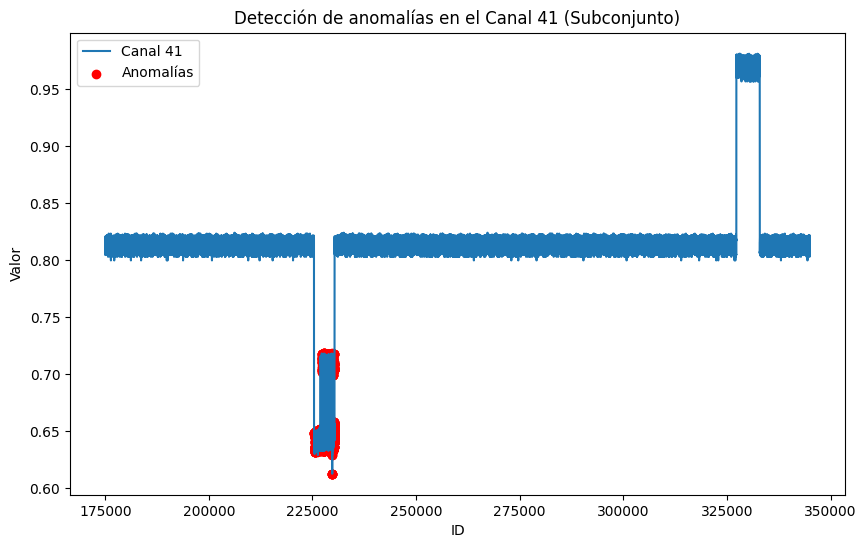

In [ ]:
subset = train.iloc[start_idx:end_idx]
anomalies_subset = anomalies[(anomalies['id'] >= subset['id'].min()) & (anomalies['id'] <= subset['id'].max())]

plt.figure(figsize=(10, 6))
plt.plot(subset['id'], subset['channel_41'], label='Canal 41')
plt.scatter(anomalies_subset['id'], anomalies_subset['channel_41'], color='red', label='Anomalías')
plt.title('Detección de anomalías en el Canal 41 (Subconjunto)')
plt.xlabel('ID')
plt.ylabel('Valor')
plt.legend()
plt.show()

In [ ]:
test = pd.read_parquet('../data/test.parquet')

features = [col for col in test.columns if col.startswith('channel_')]
X_test = test[features]
test['is_anomaly'] = model.predict(X_test)

test['is_anomaly'] = test['is_anomaly'].apply(lambda x: 1 if x == -1 else 0)

test[['id', 'is_anomaly']].to_csv('../out/predictions_IsolationForest_baseline.csv', index=False)

![IsolationForest](../out/kaggle/predictions_IsolationForest_baseline.png)

Los resultados fueron peores de lo esperado.

# Advanced experiments

## Data

In [ ]:
train_df = pd.read_parquet("../data/train.parquet")
test_df = pd.read_parquet("../data/test.parquet")

Consideramos que uno de los principales problemas que tuvimos en los baseline fue que tratamos con todas las features de `channels`, así que para estos nuevos experimentos nos centraremos en un pequeño conjunto de canales, del 41-46 siguiendo la recomendación del kaggle. <br>

Por otro lado, nos quedamos con los datos que no tienen anomalías, esto se debe a que así será más sencillo para los modelos interpretar las secuencias normales y anómalas, generando errores más altos al reconstruir fragmentos anomalos ya que nunca los han visto previamente.

In [ ]:
CHANNELS = [f"channel_{i}" for i in range(41, 47)]

scaler = StandardScaler()
X_train = scaler.fit_transform(train_df.loc[train_df["is_anomaly"] == 0, CHANNELS])
X_test = scaler.transform(test_df[CHANNELS])

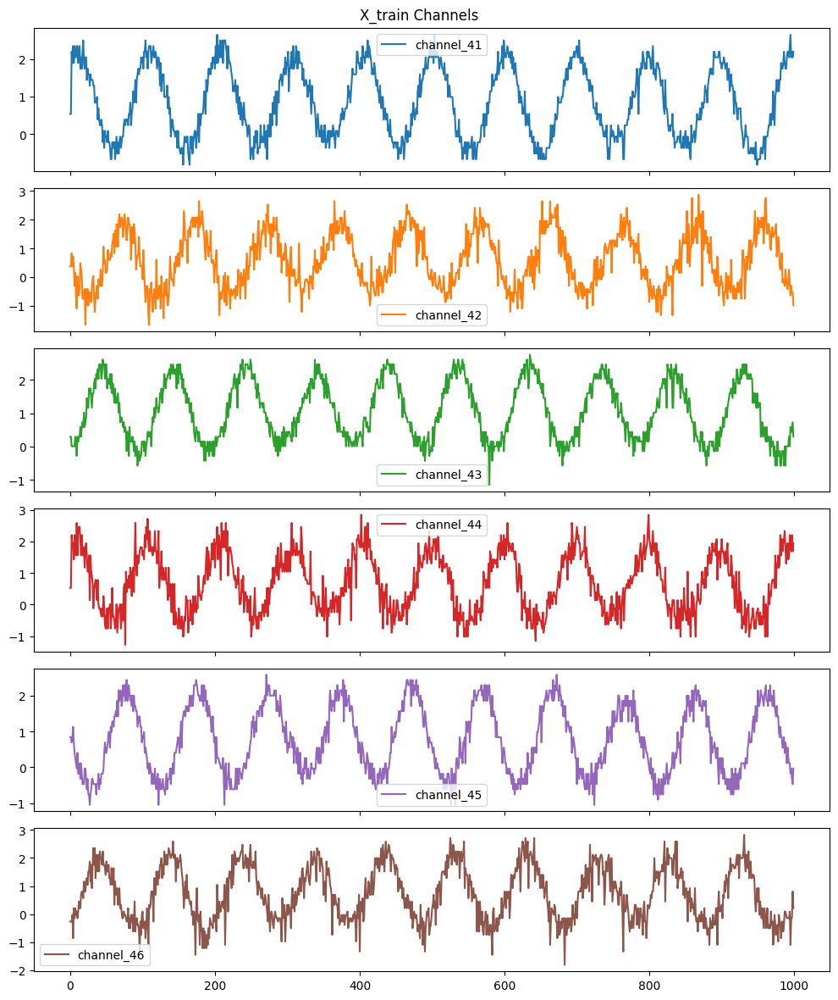

In [ ]:
X_train_df = pd.DataFrame(X_train[:1_000], columns=CHANNELS)

X_train_df.plot(subplots=True, figsize=(10, 12), title="X_train Channels")
plt.tight_layout()
plt.show()

Por otro lado, tras pelearnos en la sección anterior y teniendo como referencia las prácticas de la asignatura, decidimos estrablecer ventanas para procesar los datos. Estás ventanas aumentaron bastante la demanda de RAM de cara a los futuros entrenamientos, llevando al límite nuestros recursos. <br>

Nos vimos obligados a trabajar con ventanas de 5, ya que trabajar con ventanas más grandes hacía que se muriera el kernel del notebook o directamente no terminaba nunca de ejecutarse congelando nuestros ordenadores.

In [ ]:
timesteps = 5

def create_sequences(data, timesteps):
    return np.array([data[i:i+timesteps] for i in range(len(data)-timesteps)])

X_train_seq = create_sequences(X_train, timesteps)
X_test_seq = create_sequences(X_test, timesteps)

## Data 2

En esta sección se lleva a cabo un preprocesamiento avanzado de los datos, orientado a capturar mejor las características temporales. <br>

Tras probar con el conjunto de datos anterior pensamos que podríamos dar un paso más mejorando el preprocesado inicial, ya que anteriormente habíamos hecho simplemente una estandarización. Esta propueta consistía en aplicar transformaciones wavelet a cada canal $([41,46])$ con la ligera esperanza de eliminar ruido y resaltar patrones relevantes. <br>



In [ ]:
train_df = pd.read_parquet("../data/train.parquet")
test_df = pd.read_parquet("../data/test.parquet")

CHANNELS = [f"channel_{i}" for i in range(41, 47)]

scaler = StandardScaler()
X_train_raw = scaler.fit_transform(train_df.loc[train_df["is_anomaly"] == 0, CHANNELS])
X_test_raw = scaler.transform(test_df[CHANNELS])

timesteps = 5

def create_sequences(data, timesteps):
    return np.array([data[i:i+timesteps] for i in range(len(data)-timesteps)])

X_train_seq = create_sequences(X_train_raw, timesteps)
X_test_seq = create_sequences(X_test_raw, timesteps)


def apply_wavelet_seq(data_seq, wavelet='db4', level=1):
    n_samples, n_timesteps, n_channels = data_seq.shape
    transformed_seq = np.zeros_like(data_seq)
    
    for sample in tqdm(range(n_samples), desc="Wavelet transform"):
        for ch in range(n_channels):
            ts = data_seq[sample, :, ch]
            coeffs = pywt.wavedec(ts, wavelet=wavelet, level=level)
            ts_recon = pywt.waverec(coeffs, wavelet=wavelet)
            ts_recon = ts_recon[:n_timesteps]
            transformed_seq[sample, :, ch] = ts_recon
    return transformed_seq


X_train_seq = apply_wavelet_seq(X_train_seq)
X_test_seq = apply_wavelet_seq(X_test_seq)

Wavelet transform: 100%|██████████| 521275/521275 [01:11<00:00, 7270.72it/s]


## Models

Motivados por la filosofía de reconstrucción del estado del arte, empezamos a implementar nuestros propios modelos. <br>

Cabe destacar que estos experimentos que hemos dejado en el notebook son con el dataset de `Data` no `Data 2`, usar wavelet no supuso mejores resultados. A lo largo de la sección, se harán algunas menciones a este dataset hablando de los resultados obtenidos. <br>

### AE

In [ ]:
input_dim = X_train.shape[1]
inputs = Input(shape=(input_dim,))
encoded = Dense(16, activation='relu')(inputs)
encoded = Dropout(0.2)(encoded)
bottleneck = Dense(8, activation='relu')(encoded)
encoded = Dropout(0.2)(encoded)
decoded = Dense(16, activation='relu')(bottleneck)
decoded = Dropout(0.2)(decoded)
outputs = Dense(input_dim, activation='linear')(decoded)
autoencoder = Model(inputs, outputs)

autoencoder.compile(optimizer='adam', loss='mse')
autoencoder.summary()

I0000 00:00:1746259659.497903   19849 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3831 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:2d:00.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 6)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           102 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 494 (1.93 KB)

 Trainable params: 494 (1.93 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
autoencoder.fit(X_train, X_train, epochs=5, batch_size=1024, shuffle=True, verbose=1)

Epoch 1/5
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 33s 3ms/step - loss: 0.2135
Epoch 2/5
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 32s 2ms/step - loss: 0.1551
Epoch 3/5
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 28s 2ms/step - loss: 0.1481
Epoch 4/5
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 31s 2ms/step - loss: 0.1457
Epoch 5/5
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 31s 2ms/step - loss: 0.1450


In [ ]:
X_test_reconstructed = autoencoder.predict(X_test, batch_size=1024)
per_channel_error = np.abs(X_test - X_test_reconstructed)
z_scores = (per_channel_error - per_channel_error.mean(axis=0)) / (per_channel_error.std(axis=0) + 1e-8)
aggregated_scores = z_scores.max(axis=1)

510/510 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
def prune_anomalies(anoms, min_len=10):
    anoms = anoms.copy()
    labels, num = label(anoms)
    for i in range(1, num+1):
        idx = np.where(labels == i)[0]
        if len(idx) < min_len:
            anoms[idx] = 0
    return anoms

In [ ]:
threshold = np.percentile(aggregated_scores, 98)
binary_scores = (aggregated_scores > threshold).astype(int)

is_anomaly = prune_anomalies(binary_scores, min_len=10)

![AE_1](../out/kaggle/AE_1.png)

Parece que quedarnos con los 6 canales es una idea acertada. Aquí empezamos a ver los primeros frutos de nuesta intuición reconstruyendo la información de la secuencia, el siguiente paso fue tratar de desarrollar un modelo más complejo capaz de retener mejor la información y mejorar el score.

### LSTM Autoencoder


Una de las primeras aproximaciones que barajamos fue usar RNN (motivados por la literatura), para que a través de la memoria pudieramos retener mejor la información de los patrones en los canales, esto lo logramos añadiendo capas de LSTM. 

In [ ]:
l2_reg = l2(0.001)

inputs = Input(shape=(timesteps, input_dim))

encoded = LSTM(64, 
               return_sequences=False, 
               dropout=0.2, 
               recurrent_dropout=0.2,
               kernel_regularizer=l2_reg)(inputs)

decoded = RepeatVector(timesteps)(encoded)

decoded = LSTM(64, 
               return_sequences=True, 
               dropout=0.2, 
               recurrent_dropout=0.2,
               kernel_regularizer=l2_reg)(decoded)

outputs = TimeDistributed(Dense(input_dim, kernel_regularizer=l2_reg))(decoded)

model = Model(inputs, outputs)
model.compile(optimizer='adam', loss='mse')
model.summary()

I0000 00:00:1746262047.637015    5114 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4047 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:2d:00.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 5, 6)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 64)             │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector (RepeatVector)    │ (None, 5, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 5, 64)          │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 5, 6)           │           390 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,590 (201.52 KB)

 Trainable params: 51,590 (201.52 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.fit(X_train_seq, X_train_seq, epochs=2, batch_size=1024, shuffle=True, verbose=1)

2025-05-03 10:47:29.139364: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.
2025-05-03 10:47:30.432748: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.
2025-05-03 10:47:31.517668: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.
2025-05-03 10:47:31.914349: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.


Epoch 1/2
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 1282s 99ms/step - loss: 0.1693
Epoch 2/2
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 1310s 102ms/step - loss: 0.1083


In [ ]:
X_test_seq_reconstructed = model.predict(X_test_seq, batch_size=1024)
per_channel_error_seq = np.abs(X_test_seq - X_test_seq_reconstructed)
z_scores_seq = (per_channel_error_seq - per_channel_error_seq.mean(axis=0)) / (per_channel_error_seq.std(axis=0) + 1e-8)
aggregated_scores = z_scores_seq.max(axis=2).mean(axis=1)

510/510 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step


In [ ]:
threshold = np.percentile(aggregated_scores, 98)
binary_scores = (aggregated_scores > threshold).astype(int)

is_anomaly = prune_anomalies(binary_scores, min_len=10)

![AE_LSTM_0](../out/kaggle/AE_LSTM_0.png)

Aquí vimos el primer salto más importante del desarrollo, donde superamos a la mayoría de participantes de kaggle y nos dió un puesto entre los 8 mejores equipos en la competición.

### BLSTM Autoencoder

Para mejorar aún más el modelo decidimos usar BLSTM, de está manera la retención de la información sería más eficiente.

In [ ]:
l2_reg = l2(0.001)

inputs = Input(shape=(timesteps, input_dim))

encoded = Bidirectional(LSTM(64, 
                             return_sequences=False,
                             dropout=0.2,
                             recurrent_dropout=0.2,
                             kernel_regularizer=l2_reg))(inputs)

decoded = RepeatVector(timesteps)(encoded)

decoded = Bidirectional(LSTM(64,
                             return_sequences=True,
                             dropout=0.2,
                             recurrent_dropout=0.2,
                             kernel_regularizer=l2_reg))(decoded)

outputs = TimeDistributed(Dense(input_dim, kernel_regularizer=l2_reg))(decoded)

model = Model(inputs, outputs)
model.compile(optimizer='adam', loss='mse')
model.summary()

I0000 00:00:1746340386.743767    4011 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4047 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:2d:00.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 5, 6)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 128)            │        36,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ repeat_vector (RepeatVector)    │ (None, 5, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 5, 128)         │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 5, 6)           │           774 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 135,942 (531.02 KB)

 Trainable params: 135,942 (531.02 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model.fit(X_train_seq, X_train_seq, epochs=2, batch_size=1024, shuffle=True, verbose=1)

2025-05-04 08:33:08.507060: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.
2025-05-04 08:33:09.691133: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.
2025-05-04 08:33:10.945088: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.
2025-05-04 08:33:11.280637: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1582105440 exceeds 10% of free system memory.


Epoch 1/2
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 2658s 206ms/step - loss: 0.1277
Epoch 2/2
12876/12876 ━━━━━━━━━━━━━━━━━━━━ 2591s 201ms/step - loss: 0.0630


In [ ]:
X_test_seq_reconstructed = model.predict(X_test_seq, batch_size=1024)
per_channel_error_seq = np.abs(X_test_seq - X_test_seq_reconstructed)
z_scores_seq = (per_channel_error_seq - per_channel_error_seq.mean(axis=0)) / (per_channel_error_seq.std(axis=0) + 1e-8)
aggregated_scores = z_scores_seq.max(axis=2).mean(axis=1)

510/510 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step


In [ ]:
threshold = np.percentile(aggregated_scores, 98)
binary_scores = (aggregated_scores > threshold).astype(int)

is_anomaly = prune_anomalies(binary_scores, min_len=10)

![AE_BLSTM_0](../out/kaggle/AE_BLSTM_0.png)

Este fue otro salto bastante importante, gracías a esta mejora nos colocamos en el top 5 de mejores equipos.

### Conv1D-LSTM + Attention

Tomando como referencia el estado del arte de la sección anterior decidimos probar con convoluciones. Esto fue motivado ya que leimos que al usar convoluciones y atención podríamos mejorar las relaciones entre canales. 

In [ ]:
input_dim = X_train_seq.shape[2]
latent_dim = 64

inputs = Input(shape=(timesteps, input_dim))
x = Conv1D(filters=32, kernel_size=3, padding='same', activation='relu')(inputs)
x = LSTM(latent_dim, return_sequences=True)(x)
x = LayerNormalization()(x)

attention = Attention()([x, x])
context = Concatenate()([x, attention])
encoded = LSTM(latent_dim, return_sequences=False)(context)

decoded = RepeatVector(timesteps)(encoded)
decoded = LSTM(latent_dim, return_sequences=True)(decoded)
decoded = TimeDistributed(Dense(input_dim))(decoded)

model = Model(inputs, decoded)
model.compile(optimizer=Adam(1e-3), loss='mse')
model.summary()

I0000 00:00:1747549798.894817     925 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4047 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:2d:00.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 5, 17)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 5, 32)     │      1,664 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 5, 64)     │     24,832 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 5, 64)     │        128 │ lstm[0][0]        │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attention           │ (None, 5, 64)     │          0 │ layer_normalizat… │
│ (Attention)         │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 5, 128)    │          0 │ layer_normalizat… │
│ (Concatenate)       │                   │            │ attention[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 64)        │     49,408 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 5, 64)     │          0 │ lstm_1[0][0]      │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 5, 64)     │     33,024 │ repeat_vector[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 5, 17)     │      1,105 │ lstm_2[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 110,161 (430.32 KB)

 Trainable params: 110,161 (430.32 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    X_train_seq, X_train_seq,
    epochs=1,
    batch_size=1024,
    verbose=1
)

2025-05-10 11:41:19.961650: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1265684160 exceeds 10% of free system memory.


10301/10301 ━━━━━━━━━━━━━━━━━━━━ 193s 19ms/step - loss: 5.2631e-04 - val_loss: 2.8885e-04


In [ ]:
X_test_seq_reconstructed = model.predict(X_test_seq, batch_size=1024)
per_channel_error_seq = np.abs(X_test_seq - X_test_seq_reconstructed)
z_scores_seq = (per_channel_error_seq - per_channel_error_seq.mean(axis=0)) / (per_channel_error_seq.std(axis=0) + 1e-8)
aggregated_scores = z_scores_seq.max(axis=2).mean(axis=1)

510/510 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step


In [ ]:
threshold = np.percentile(aggregated_scores, 98)
binary_scores = (aggregated_scores > threshold).astype(int)

is_anomaly = prune_anomalies(binary_scores, min_len=10)

Las perdidas fueron bastante buenas, las más bajas de todos los modelos probados, esto nos hizo comenter overfitting. A pesar de que en la celda de arriba hayamos dejado la ejecución con 1 epoch, incialmente hicimos 2 epochs como en los modelos anteriores donde obtuvimos: <br>

![Conv_LSTM_Att_0](../out/kaggle/Conv_LSTM_Att_0.png) <br>

Este resultado es inferior al modelo anterior. Sin embargo, volviendo a ejecutar el fit pero con 1 epoch obtuvimos: <br>

![Conv_LSTM_Att_1](../out/kaggle/Conv_LSTM_Att_1.png) <br>

Curiosamente es el mismo score que en el BLSTM-AE. Ya que este modelo nos ha ofrecido muy buenos resultados, probamos a modificar el umbral. Este úmbral viene definido por el método prune_anomalies donde siempre habíamos utilizado el percentil $98$. <br>

![Conv_LSTM_Att_2](../out/kaggle/Conv_LSTM_Att_2.png) <br>

Ya que no obtuvimos resultados favorables, volvimos al percentil $98$. Ya que este modelo nos dió buenos resultados mantuvimos nuestra mejor configuración y lo entrenamos con los datos preprocesados con wavelet: <br>

![Conv_LSTM_Att_3](../out/kaggle/Conv_LSTM_Att_3.png) <br>

Obtuvimos peores resultados, volvimos a los otros datos y tratamos de buscar otras alternativas.

### Conv1D-BLSTM + Attention

Motivados por los resultados anteriores, pensamos que añadir capas bidireccionales daría un mejor resultado, asi que lo probamos.

In [ ]:
input_dim = X_train.shape[1]  
latent_dim = 64

inputs = Input(shape=(timesteps, input_dim))
x = Conv1D(filters=32, kernel_size=3, padding='same', activation='relu')(inputs)
x = Bidirectional(LSTM(latent_dim, return_sequences=True))(x)
x = LayerNormalization()(x)

attention = Attention()([x, x])
context = Concatenate()([x, attention])
encoded = Bidirectional(LSTM(latent_dim, return_sequences=False))(context)

decoded = RepeatVector(timesteps)(encoded)
decoded = Bidirectional(LSTM(latent_dim, return_sequences=True))(decoded)
decoded = TimeDistributed(Dense(input_dim))(decoded)

model = Model(inputs, decoded)
model.compile(optimizer=Adam(1e-3), loss='mse')
model.summary()

I0000 00:00:1746891678.408197    4520 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4047 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:2d:00.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 7, 6)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 7, 32)     │        608 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 7, 128)    │     49,664 │ conv1d[0][0]      │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 7, 128)    │        256 │ bidirectional[0]… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attention           │ (None, 7, 128)    │          0 │ layer_normalizat… │
│ (Attention)         │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 7, 256)    │          0 │ layer_normalizat… │
│ (Concatenate)       │                   │            │ attention[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 128)       │    164,352 │ concatenate[0][0] │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 7, 128)    │          0 │ bidirectional_1[… │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_2     │ (None, 7, 128)    │     98,816 │ repeat_vector[0]… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 7, 6)      │        774 │ bidirectional_2[… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 314,470 (1.20 MB)

 Trainable params: 314,470 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    X_train_seq, X_train_seq,
    epochs=1,
    batch_size=1024,
    verbose=1
)

2025-05-10 17:41:20.161672: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1771957488 exceeds 10% of free system memory.
2025-05-10 17:41:21.859623: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1771957488 exceeds 10% of free system memory.
2025-05-10 17:41:23.791693: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1771957488 exceeds 10% of free system memory.
2025-05-10 17:41:24.101066: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1771957488 exceeds 10% of free system memory.


Epoch 1/2


I0000 00:00:1746891692.135849    4684 cuda_dnn.cc:529] Loaded cuDNN version 90300


10301/10301 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1391

In [ ]:
X_test_seq_reconstructed = model.predict(X_test_seq, batch_size=1024)
per_channel_error_seq = np.abs(X_test_seq - X_test_seq_reconstructed)
z_scores_seq = (per_channel_error_seq - per_channel_error_seq.mean(axis=0)) / (per_channel_error_seq.std(axis=0) + 1e-8)
aggregated_scores = z_scores_seq.max(axis=2).mean(axis=1)

510/510 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step


In [ ]:
threshold = np.percentile(aggregated_scores, 98)
binary_scores = (aggregated_scores > threshold).astype(int)

is_anomaly = prune_anomalies(binary_scores, min_len=10)

![Conv_BLSTM_Att_0](../out/kaggle/Conv_BLSTM_Att_0.png)

Los resultados fueron peores, esto sugiere que la arquitectura podría no ser la más adecuada para este caso de estudio. Pensamos que añadir BLSTM añade una complejidad extra al modelo que es inecesaria y que no aporta nada a la detección de patrones. <br>

Además este modelo rozaba el límite de nuestros recursos, si vemos los logs del entrenamiento podemos ver: "Allocation of 1771957488 exceeds 10% of free system memory.". Entrenar se volvió un suplicio, esto nos hizo ir mucho más lento y nos empezaba a limitar nuestra creatividad.

### Conv2D-LSTM + Attention

Para tratar de dar un paso más, probamos a usar `Conv2D`. Partimos de la suposición de que al estar procesando señales y existir una estrecha relación con las imágenes podríamos conseguir buenos resultados.

In [ ]:
input_dim = X_train.shape[1]

inputs = Input(shape=(timesteps, input_dim)) 

x = Reshape((timesteps, input_dim, 1))(inputs)

x = Conv2D(filters=16, kernel_size=(3, 3), padding="same", activation="relu")(x)
x = Conv2D(filters=32, kernel_size=(3, 3), padding="same", activation="relu")(x)

x = Reshape((timesteps, -1))(x)
x = LSTM(64, return_sequences=True)(x)
x = LayerNormalization()(x)

attn = Attention()([x, x])
x = Concatenate()([x, attn])
encoded = LSTM(64, return_sequences=False)(x)

decoded = RepeatVector(timesteps)(encoded)
decoded = LSTM(64, return_sequences=True)(decoded)
decoded = TimeDistributed(Dense(input_dim))(decoded)

model = Model(inputs, decoded)
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 5, 6)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_4 (Reshape) │ (None, 5, 6, 1)   │          0 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 5, 6, 16)  │        160 │ reshape_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 5, 6, 32)  │      4,640 │ conv2d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_5 (Reshape) │ (None, 5, 192)    │          0 │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 5, 64)     │     65,792 │ reshape_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 5, 64)     │        128 │ lstm_3[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ attention_1         │ (None, 5, 64)     │          0 │ layer_normalizat… │
│ (Attention)         │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 5, 128)    │          0 │ layer_normalizat… │
│ (Concatenate)       │                   │            │ attention_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 64)        │     49,408 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_1     │ (None, 5, 64)     │          0 │ lstm_4[0][0]      │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 5, 64)     │     33,024 │ repeat_vector_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_1  │ (None, 5, 6)      │        390 │ lstm_5[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 153,542 (599.77 KB)

 Trainable params: 153,542 (599.77 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    X_train_seq, X_train_seq,
    epochs=1,
    batch_size=1024,
    validation_data=(X_val_seq, X_val_seq),
    verbose=1
)

2025-05-17 08:28:22.183997: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1265684160 exceeds 10% of free system memory.
2025-05-17 08:28:23.317819: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1265684160 exceeds 10% of free system memory.
2025-05-17 08:28:24.273930: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1265684160 exceeds 10% of free system memory.
2025-05-17 08:28:24.529508: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1265684160 exceeds 10% of free system memory.
I0000 00:00:1747463309.020101    2689 cuda_dnn.cc:529] Loaded cuDNN version 90501


10301/10301 ━━━━━━━━━━━━━━━━━━━━ 205s 19ms/step - loss: 0.1071 - val_loss: 0.0010


In [ ]:
X_test_seq_reconstructed = model.predict(X_test_seq, batch_size=1024)
per_channel_error_seq = np.abs(X_test_seq - X_test_seq_reconstructed)
z_scores_seq = (per_channel_error_seq - per_channel_error_seq.mean(axis=0)) / (per_channel_error_seq.std(axis=0) + 1e-8)
aggregated_scores = z_scores_seq.max(axis=2).mean(axis=1)

510/510 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step


In [ ]:
threshold = np.percentile(aggregated_scores, 98)
binary_scores = (aggregated_scores > threshold).astype(int)

is_anomaly = prune_anomalies(binary_scores, min_len=10)

![Conv2_LSTM_Att_0](../out/kaggle/Conv2_LSTM_Att_0.png)

A pesar de que teníamos mucha ilusión con este experimento, no obtuvimos buenos resultados.

# Results

Para testear tuvimos muchos problemas, inicialmente probamos a guardarnos un conjunto de test haciendo un `split` de train para sacar métricas. Sin embargo, llevamos tan al límite nuestros recursos que en muchas ocasiones al procesar los resultados se nos moría el kernel, teníamos lo justo para entrenar y generar los CSV. <br>

Podríamos haber guardado los pesos y ejecutar métricas a parte pero como los resultados del kaggle superaban a la mayoría de equipos pensamos que lo mejor sería tratar de usar todos los recursos existentes en subir el score público de la competición asumiendo que vamos por buen camino. <br>

El código de los CSVs es:

In [ ]:
aligned_ids = test_df["id"].iloc[timesteps:].reset_index(drop=True)

submission_df = pd.DataFrame({
    "id": aligned_ids,
    "is_anomaly": is_anomaly
})

submission_df.to_csv("../out/X.csv", index=False)

Simplemente cargamos el conjunto de `test` y las anomalías generadas al final de cada entrenamiento. <br>

## Summary

| Model                                               | Public Score |
|-----------------------------------------------------|--------------|
| Conv1D-LSTM_Attention_Telemanom_1_98.csv            | 0.735        |
| BLSTM_AE_Telemanom_0.98.csv                         | 0.735        |
| Conv1D-LSTM_Attention_Telemanom_0_98.csv            | 0.666        |
| Conv1D-LSTM_Attention_Telemanom_1_wavelet.csv       | 0.666        |
| LSTM_AE_Telemanom_0.98.csv                          | 0.657        |
| Conv1D-BLSTM_Attention_Telemanom_0.csv              | 0.588        |
| Conv1D-LSTM_Attention_Telemanom_1_new_threshold.csv | 0.576        |
| Conv2D-LSTM_Attention_Telemanom_0.csv               | 0.576        |
| AE_Telemanom_1.csv                                  | 0.277        |
| IsolationForest.csv                                 | 0.004        |

# Conclusions



Estamos satisfechos con nuestros resultados, a día en el que se esta redactando este documento somos los 5º de 53 equipos. Teniendo en cuenta que seguramente tendremos menos experiencia que los demás participantes creemos que hemos hecho un gran trabajo. <br>

Nos habría gustado probar más ideas que teníamos en mente, entre ellas que pasaría si aumentamos el tamaño de ventana. Actualmente, estos experimentos han sido con un tamaño de $5$ motivados por la falta de recursos, creemos que si hubieramos podido desarrollar en equipos más potentes podríamos haber mejorado nuestros resultados probando con ventanas más grandes. <br>

Otro problema fueron las features, estamos usando solo los canales $41-46$ cuando hay varias columnas como `telecommand_` que si hubieramos podido explorar habría reducido las posibilidades de overfitting y nos habría permitido ejecutar más de 2 epochs. <br>

Algo que también habría sido muy interesante es crear una especie de ensemble combinando los autoencoders para reconstruir y otro modelo para predecir, todo en el mismo pipeline (ya sobrepasabamos en un 10% los resursos, no llevamos ni a implementarlo). En cuanto al preprocesado, pensabamos que aplicar transformadas de wavelet podría ser útil ya que al  descomponer la señal en diferentes niveles de resolución temporal-frecuencia. Seguramente existan mejores aproximaciones para tratar los datos, pero de manera similar a los entrenamientos al ser tantos datos el tiempo de ejecución de disparaba y el kernel moría. <br>

También habría estado bien poder hacer búsqueda de hiperparámetros, tratando de llevar al limite nuestros modelos. Teníamos una carpeta dedicada a este tuning con un contenedor docker preparado para hacer búsquedas con [Ray Tune](https://docs.ray.io/en/latest/tune/index.html) desde JupyterLab, pero finalmente no llegamos a hacer la búsqueda ya que tampoco sabíamos como plantear las métricas a minimizar debido a que los modelos se encargan de reconstruir. Podríamos haber minimizado en base al loss que devolvía pera si ya de normal había overfitting debido al tamaño tan reducido de ventana y a que solo estabamos usando 6 canales no consideramos que hubiese aportado mucho sin aumentar las features o el tamaño de ventana (no podíamos por falta de recursos). <br>

Con más tiempo, sería interesante reproducir alguno de los papers del estado del arte aprovechando que la mayoría tienen Github. De ese modo podríamos ganar fácilmente la competición.

Si tuvieramos que escoger alguno de los modelos anteriores, nos quedamos con el `Conv1D-LSTM_Attention_Telemanom_1_98.csv`, consideramos que es más robusto que el `BLSTM_AE_Telemanom_0.98.csv` gracias a las convoluciones y a las capas de attention, permitiendole interpretar mejor los patrones intrínsecos de los datos. 